Test elastic problems using MFEANet

* Polycrystal elastic analysis

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torch.nn.modules.utils import _pair
import os
import numpy as np
import matplotlib.pyplot as plt
import math
import time
from functools import reduce

from utils import plot
from feanet.singlegrid import SingleGrid
from feanet.multigrid import MultiGrid
from feanet.iterator import PsiNet
from feanet.iterator import PsiIterator
from data.dataset import MechanicalDataSet

In [2]:
device_predict = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') #torch.device('cpu')
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [3]:
bs = 1 # batch size
k = 0 # test data index
mode = 'plane_stress' # plane strain or plane stress
n_test = 2**6
no_neumann = False
ku, kf = 2, 2
nb_layers = 3
h = 0.1
model_name = 'dirich_33x33_smoother'
model_dir = 'model/learn_iterator/elastic'

test_set = MechanicalDataSet('data/data_elasticity/polycrystal.h5', device)
test_dataloader = DataLoader(test_set, batch_size=bs, shuffle=True)
elem_mask_test, node_mask_test, dirich_idx_test, dirich_value_test, neumann_idx_test, neumann_value_test, neumann_conn_test, material_test, f_test, u_test = next(iter(test_dataloader))
solution_test, rhs_test, d_test, d_idx_test, t_idx_test, t_test, t_conn_test, m_test, emsk_test, nmsk_test = (torch.unsqueeze(u_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(f_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(dirich_value_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(dirich_idx_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(neumann_idx_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(neumann_value_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(neumann_conn_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(material_test[k], 0).to(device_predict),
                                                                         torch.unsqueeze(elem_mask_test[k], 0).to(device_predict),
                                                                         torch.unsqueeze(node_mask_test[k], 0).to(device_predict))

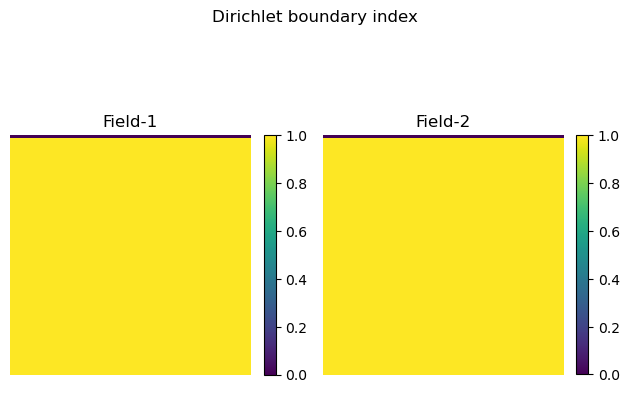

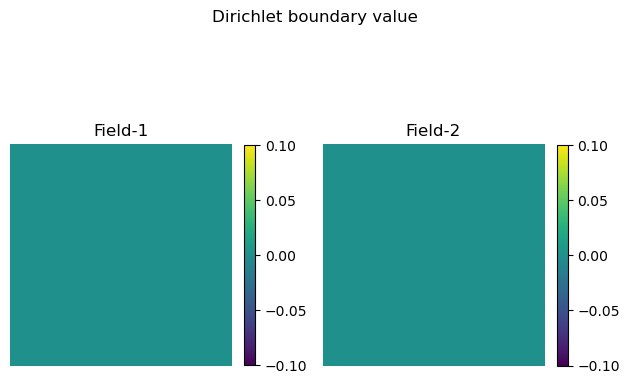

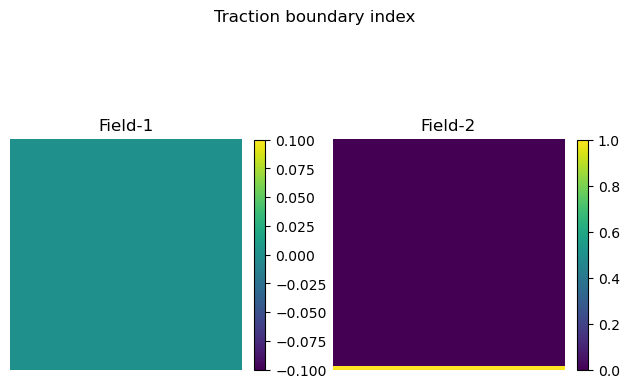

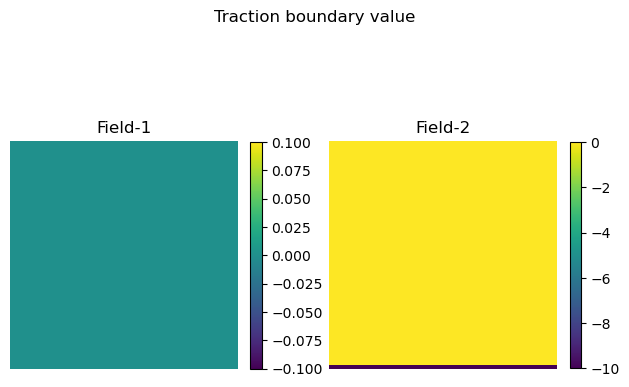

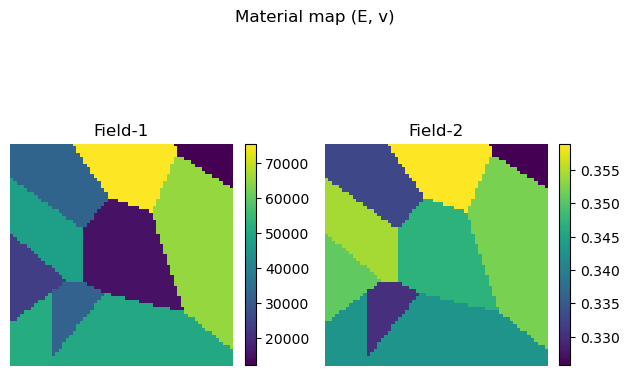

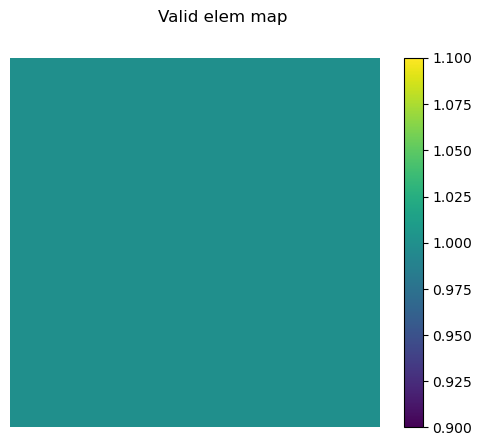

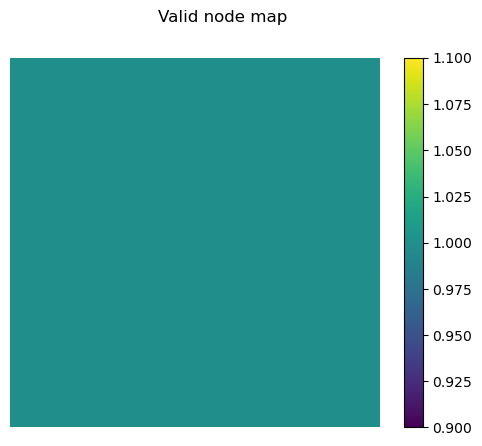

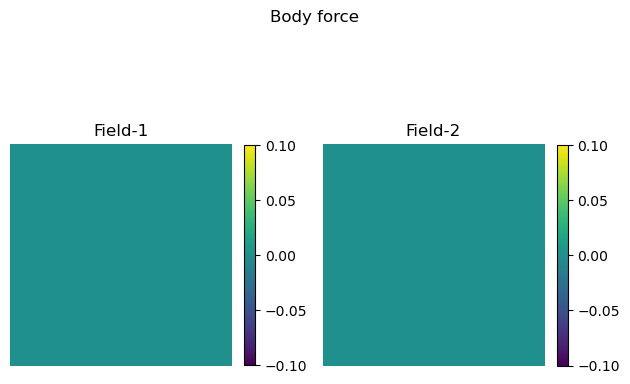

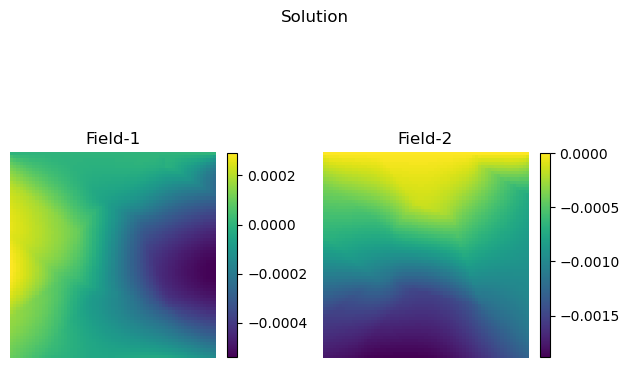

In [4]:
plot.plot_elasticfield(dirich_idx_test[k], ftitle='Dirichlet boundary index')
plot.plot_elasticfield(dirich_value_test[k], ftitle='Dirichlet boundary value')
plot.plot_elasticfield(neumann_idx_test[k], ftitle='Traction boundary index')
plot.plot_elasticfield(neumann_value_test[k], ftitle='Traction boundary value')
plot.plot_elasticfield(material_test[k], ftitle='Material map (E, v)')
plot.plot_thermalfield(elem_mask_test[k], ftitle='Valid elem map')
plot.plot_thermalfield(node_mask_test[k], ftitle='Valid node map')
plot.plot_elasticfield(f_test[k], ftitle='Body force')
plot.plot_elasticfield(u_test[k], ftitle='Solution')

In [5]:
n_elem = n_test
grid = SingleGrid(h, n_elem, mode, device_predict, no_neumann)

0 7.985439699976138
1 6.323752755192302
2 4.635718166708695
3 4.486710807579472
4 4.113541508267572
5 3.975511517105747
6 3.807714461189009
7 3.6964725934168743
8 3.5894733240273897
9 3.50251775717432
10 3.4232007942228226
11 3.3537764819014946
12 3.290634787317625
13 3.2335835308819356
14 3.1812558815856145
15 3.1331655943713406
16 3.088637163151492
17 3.0472609890437408
18 3.0086319335371057
19 2.972445941103938
20 2.9384309928566696
21 2.9063642391153635
22 2.876051076171956
23 2.8473257195816033
24 2.820043372942097
25 2.7940781164083854
26 2.769319189308261
27 2.7456689905969305
28 2.7230409505520723
29 2.7013580296464426
30 2.6805513530392244
31 2.660559133873552
32 2.6413257398338024
33 2.622800920895611
34 2.604939146683837
35 2.5876990452596687
36 2.5710429203984497
37 2.5549363370658944
38 2.5393477626458862
39 2.524248255814327
40 2.509611195379544
41 2.495412043267395
42 2.481628136564471
43 2.468238504509681
44 2.455223706928294
45 2.4425656911927867
46 2.4302476652318843


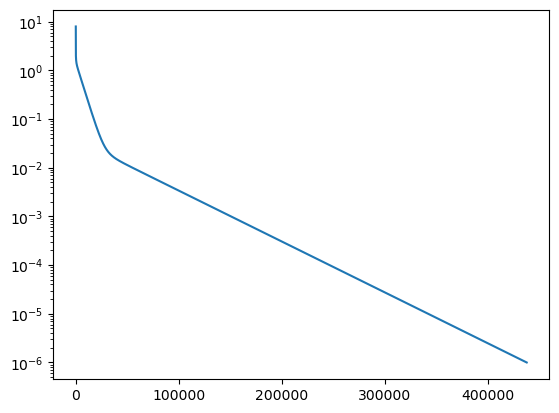

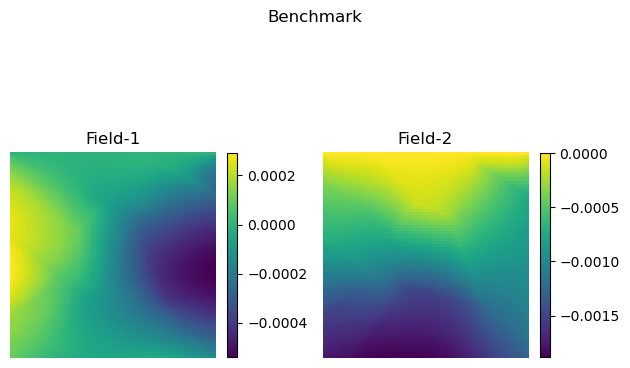

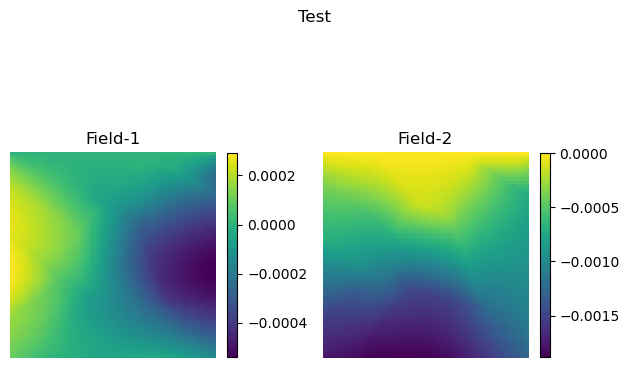

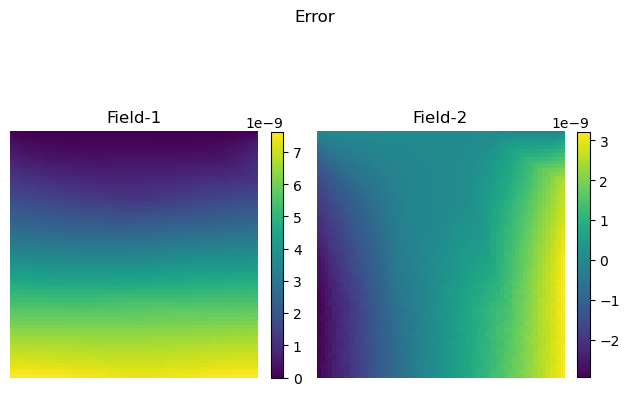

In [6]:
EPS = 1e-6
n_jac = 0
jacu_test = EPS*torch.ones(size=(1, ku, n_elem+1, n_elem+1), requires_grad=False, dtype=torch.double).to(device_predict)
jacu_test = grid.jac.reset_boundary(jacu_test, d_test, d_idx_test)
residual = grid.net(None, None, h, jacu_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
res = torch.norm(residual).item() 
res_arr = [res]

if (True):
    print(n_jac, res)
    while (abs(res) > EPS):
        jacu_test = grid.jac.jacobi_convolution(jacu_test, m_test, nmsk_test, d_test, d_idx_test, None, None, h, rhs_test, t_test, t_conn_test)
        residual = grid.net(None, None, h, jacu_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual).item() 
        res_arr.append(res)
        n_jac += 1
        print(n_jac, res)

    print("Solution converges after", n_jac, "Jacobi iterations ")

    plt.plot(res_arr)
    plt.yscale('log')
    plt.show()

    plot.plot_elasticfield(jacu_test[0], "Benchmark")
    plot.plot_elasticfield(solution_test[0], "Test")
    plot.plot_elasticfield(jacu_test[0]-solution_test[0], 'Error')

Text(0.5, 0, 'epoch')

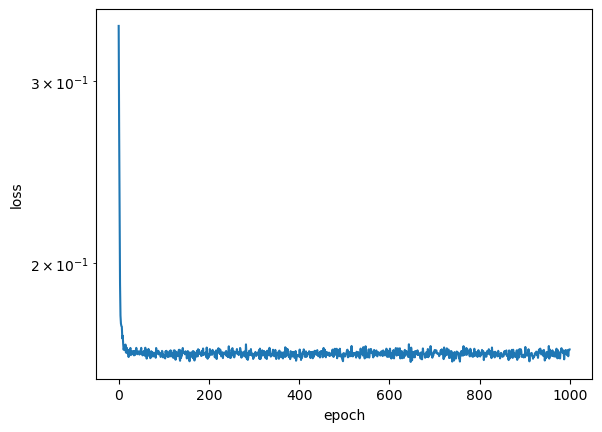

In [7]:
# import the learned model and loss train
no_neumann_test = False # considering Neumann bc for testing
my_net = PsiNet(nb_layers=nb_layers, mode='elastic').to(device_predict)
my_net.load_state_dict(torch.load(os.path.join(model_dir,model_name+'.pth')))
new_iterator = PsiIterator(device_predict, h, n_elem, no_neumann_test, psi_net=my_net, grid=grid, nb_layers=nb_layers, batch_size=1, iterator='psi')
my_loss = torch.load(os.path.join(model_dir,model_name+'.pt'))
plt.plot(my_loss)
plt.ylabel('loss')
plt.yscale('log')
plt.xlabel('epoch')
# plt.savefig('results/smoother_loss.jpg', dpi=500, bbox_inches='tight')

0 7.985439699976138
1 5.956472407854365
2 3.9143936674943545
3 3.487388743471308
4 3.1119210890687117
5 2.909545513199867
6 2.745389379755384
7 2.6222624259067184
8 2.520678931210195
9 2.4365143294172
10 2.364725642494111
11 2.302757584909316
12 2.2485270292071164
13 2.200606640535402
14 2.1578865703213057
15 2.1195203439272206
16 2.084836251288612
17 2.0532969386170232
18 2.024464867564897
19 1.9979801405504887
20 1.9735435177747935
21 1.9509040943405451
22 1.9298498557285153
23 1.9102004478390349
24 1.8918015170336477
25 1.8745202414030366
26 1.858241757329652
27 1.8428662767842037
28 1.8283067409248377
29 1.8144868959480682
30 1.8013397042184467
31 1.78880602416796
32 1.7768335073014756
33 1.7653756718684317
34 1.7543911212226737
35 1.7438428813895823
36 1.7336978373791985
37 1.7239262517049285
38 1.7145013516527223
39 1.7053989742933426
40 1.696597260185395
41 1.6880763882886431
42 1.679818345878388
43 1.6718067282853781
44 1.6640265641308059
45 1.6564641624195102
46 1.649106978427

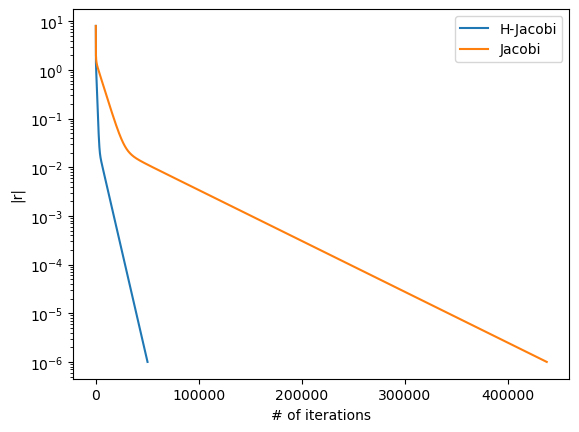

In [8]:
with torch.no_grad():
    n_new = 0
    u_test = EPS*torch.ones(size=(1, ku, n_elem+1, n_elem+1), requires_grad=False, dtype=torch.double).to(device_predict)
    u_test = new_iterator.grid.jac.reset_boundary(u_test, d_test, d_idx_test)
    residual_H = new_iterator.grid.net(None, None, h, u_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
    res = torch.norm(residual_H).item() # fix top, apply traction force at bottom boundary
    res_arr_new = [res]
    print(n_new, res)
    while (abs(res) > EPS):
        u_test = new_iterator.PsiRelax(u_test, m_test, nmsk_test, d_test, d_idx_test, None, None, h, rhs_test, t_test, t_conn_test, 1)
        residual_H = new_iterator.grid.net(None, None, h, u_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual_H).item()
        res_arr_new.append(res)
        n_new += 1
        print(n_new, res)

print("Solution converges after", n_new, "iterations ")
plt.plot(res_arr_new, label='H-Jacobi')
plt.plot(res_arr, label='Jacobi')
plt.ylabel('|r|')
plt.xlabel('# of iterations')
plt.yscale('log')
plt.legend()
plt.savefig('results/jac_res.jpg', dpi=500, bbox_inches='tight')
plt.show()

0 7.985439699976138
1 3.1811978882534344
2 1.8491319137112605
3 1.378400396838643
4 1.0712047671007412
5 0.8268663134301415
6 0.6326417447601008
7 0.4810957557090667
8 0.3645576728939773
9 0.2758650616442349
10 0.20886763067635258
11 0.1585409959562687
12 0.12090510913594528
13 0.09286836012154133
14 0.07205837228577851
15 0.05666688807844174
16 0.04531896981093263
17 0.03696872152722584
18 0.03082009904153433
19 0.026269193791169612
20 0.022862656668636017
21 0.02026635992192451
22 0.018239719261867644
23 0.016613533285556592
24 0.015271097618435404
25 0.014132938791905336
26 0.013145213345816524
27 0.01227135557360313
28 0.011486305655266746
29 0.0107726314607429
30 0.010117967009168963
31 0.00951333474540507
32 0.008952048506647672
33 0.00842899369013393
34 0.007940151451890741
35 0.0074822810066127446
36 0.007052704917525329
37 0.006649162042282829
38 0.00626970538959212
39 0.005912630139150597
40 0.005576422171852776
41 0.005259720721708761
42 0.004961290870086376
43 0.00468000298

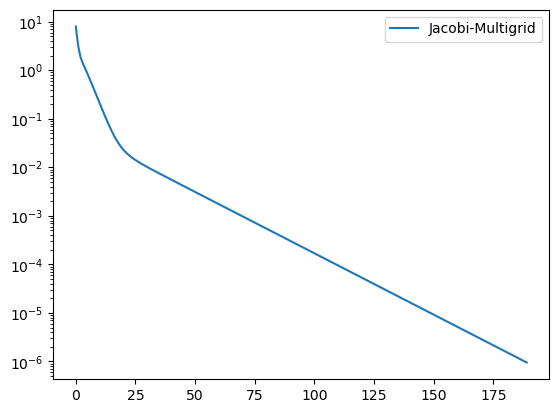

In [9]:
with torch.no_grad():
    n = n_test
    n_mg_jac = 0
    mg_jac = MultiGrid(h, n, no_neumann=no_neumann_test, pacnet=None, device=device, nb_layers=3, mode=mode, iterator='jac') # create a multigrid model
    mg_jac.ProblemDictArray(rhs_test,t_test,t_conn_test,d_test,d_idx_test,m_test,nmsk_test)
    u_mg_jac = EPS*torch.ones((1, ku, n+1, n+1), requires_grad=False, dtype=torch.double).to(device)
    u_mg_jac = mg_jac.iterators[0].grid.jac.reset_boundary(u_mg_jac, d_test, d_idx_test)
    residual = mg_jac.iterators[0].grid.net(None, None, h, u_mg_jac, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
    res = torch.norm(residual).item()
    err_occured = False
    res_arr_mgjac = [res]
    print(n_mg_jac, res)

    start = time.time()
    while (abs(res) > EPS):
        u_mg_jac = mg_jac.Step(u_mg_jac)
        residual = mg_jac.iterators[0].grid.net(None, None, h, u_mg_jac, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual).item()
        res_arr_mgjac.append(res)
        n_mg_jac += 1
        print(n_mg_jac, res)

        if(res == torch.inf or math.isnan(res)):
            err_occured = True
            break

    end = time.time()

if(err_occured):
    print("The iteration doesn't converge!")
else:
    print("Solution converges after", n_mg_jac, "Jacobi multigrid iterations in", end-start, 'seconds.')
    
plt.plot(res_arr_mgjac, label='Jacobi-Multigrid')
plt.yscale('log')
plt.legend()
plt.show()


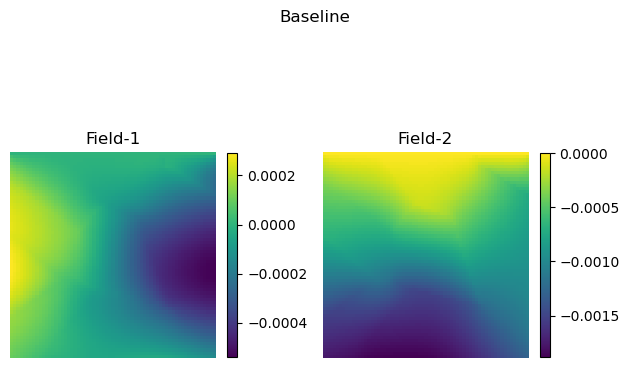

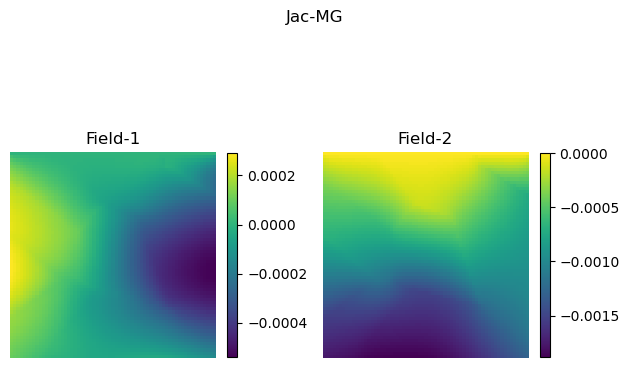

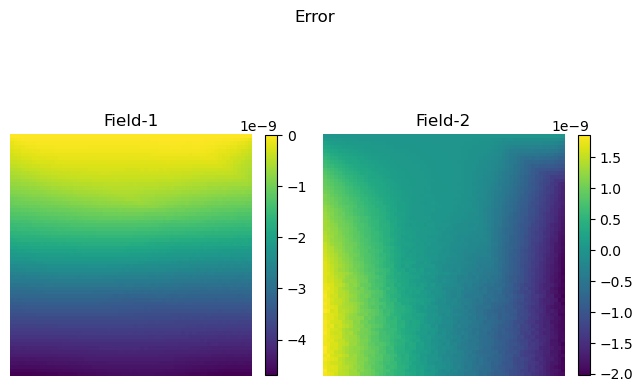

In [10]:
plot.plot_elasticfield(solution_test[k], ftitle='Baseline')
plot.plot_elasticfield(u_mg_jac[k], ftitle='Jac-MG')
plot.plot_elasticfield(solution_test[k]-u_mg_jac[k], ftitle='Error')

In [11]:
from feanet.post_processing import ElasticPostProcessing
ePost = ElasticPostProcessing(h, 'plane_stress', m_test.float(), emsk_test.float(), nmsk_test.float())
ePost.ComputeStrain(u_mg_jac.float())
ePost.ComputeStress(u_mg_jac.float())
energy = ePost.ComputeStrainEnergyDensity()

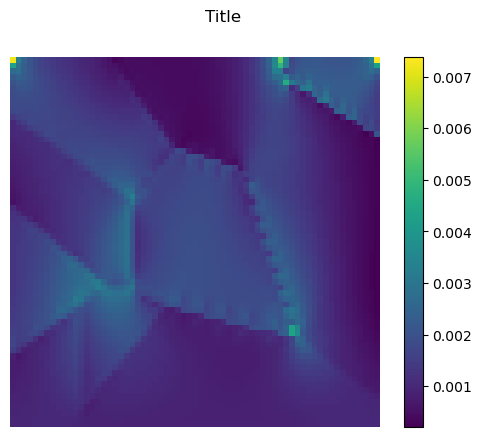

In [12]:
plot.plot_thermalfield(energy[0])

In [13]:
with torch.no_grad():
    n = n_elem
    n_mg_psi = 0
    mg_psi = MultiGrid(h, n, no_neumann_test, pacnet=my_net, device=device, nb_layers=nb_layers, mode=mode, iterator='psi') # create a multigrid model
    mg_psi.ProblemDictArray(rhs_test,t_test,t_conn_test,d_test,d_idx_test,m_test,nmsk_test)
    u_mg_psi = EPS*torch.ones((1, ku, n+1, n+1), requires_grad=False, dtype=torch.double).to(device)
    u_mg_psi = mg_psi.iterators[0].grid.jac.reset_boundary(u_mg_psi, d_test, d_idx_test)
    residual = mg_psi.iterators[0].grid.net(None, None, h, u_mg_psi, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
    res = torch.norm(residual).item()
    err_occured = False
    res_arr_mgpsi = [res]
    print(n_mg_psi, res)

    start = time.time()
    while (abs(res) > EPS):
        u_mg_psi = mg_psi.Step(u_mg_psi)
        residual = mg_psi.iterators[0].grid.net(None, None, h, u_mg_psi, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual).item()
        res_arr_mgpsi.append(res)
        n_mg_psi += 1
        print(n_mg_psi, res)

        if(res == torch.inf or math.isnan(res)):
            err_occured = True
            break

    end = time.time()

if(err_occured):
    print("The iteration doesn't converge!")
else:
    print("Solution converges after", n_mg_psi, "Psi-Jacobi multigrid iterations in", end-start, 'seconds.')


0 7.985439699976138
1 2.162370539984477
2 0.7334452014630398
3 0.2783419840582516
4 0.11518695652883675
5 0.0561223119935615
6 0.03648603800895646
7 0.02927880639775724
8 0.0249645376215253
9 0.021389299759185784
10 0.018234432595566445
11 0.015474057929338836
12 0.01309350089590869
13 0.011060876623835127
14 0.009335419406183439
15 0.007875390369314643
16 0.006642062463268468
17 0.005601164836094074
18 0.004723079692196986
19 0.003982516930502471
20 0.003358014466663996
21 0.0028314162271890755
22 0.0023873876963185353
23 0.0020129881214652734
24 0.0016973014386233985
25 0.0014311214678367848
26 0.0012066849248361486
27 0.001017445636821303
28 0.0008578838811996592
29 0.0007233455029528051
30 0.000609906210108688
31 0.0005142571288828215
32 0.00043360829735761085
33 0.0003656072896814591
34 0.00030827060024074364
35 0.00025992578813407877
36 0.00021916269427304307
37 0.00018479230897236416
38 0.00015581209004118855
39 0.000131376719828293
40 0.00011077344839439955
41 9.340130338539868

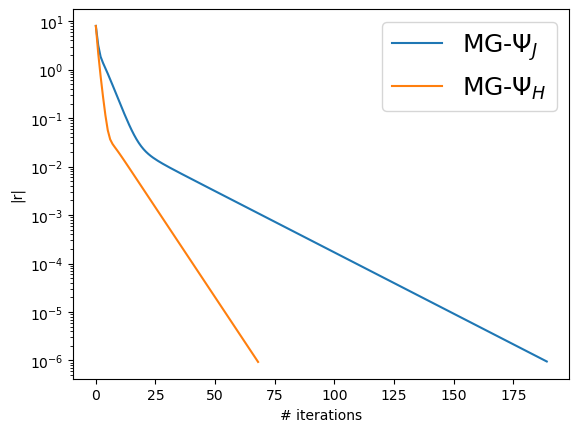

In [14]:
plt.plot(res_arr_mgjac, label='MG-$\Psi_J$')
plt.plot(res_arr_mgpsi, label='MG-$\Psi_H$')
plt.yscale('log')
plt.xlabel('# iterations')
plt.ylabel('|r|')
plt.legend(prop={'size':18})
plt.show()